# Assignment 3
## Image Generation

在这节任务中，我们将使用图像梯度生成类可视化、特征反演和 DeepDream

In [1]:
import time, os, json
import numpy as np
from imageio import imread
from PIL import Image
#from scipy.misc import imread, imresize
import matplotlib.pyplot as plt

from cs231n.classifiers.pretrained_cnn import PretrainedCNN
from cs231n.data_utils import load_tiny_imagenet
from cs231n.image_utils import blur_image, deprocess_image, preprocess_image

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

## TinyImageNet and pretrained model

In [2]:

data = load_tiny_imagenet('cs231n/datasets/tiny-imagenet-100-A', subtract_mean=True)
model = PretrainedCNN(h5_file='cs231n/datasets/pretrained_model.h5')

loading training data for synset 20 / 100
loading training data for synset 40 / 100
loading training data for synset 60 / 100
loading training data for synset 80 / 100
loading training data for synset 100 / 100


## Class visuallization

通过随机噪声图像和对目标类执行梯度上升，我们能够产生一张在网络看起来是目标类的图片。这个想法最早在 Deep Inside Convolutional Networks: Visualising Image Classification Models and Saliency Maps 一文中提出，后来在 Understanding Neural Networks Through Deep Visualization 中作者提出了几种可以提高生成图像质量的睁着化技术

具体来说，$I$ 表示一张图片， $y$ 表示目标类，$s_y(I)$ 表示卷积神经网络对图片 $I$ 属于分类 $y$ 的得分。注意，这个得分是原始的未经标准化处理的得分，而不是分类概率。我们希望尝试生成一张图片 $I^*$能够获得较高的 $y$ 分类得分，该问题可以描述为如下的公式 

$$I^*=argmax_Is_y(I)+R(I)$$ 

其中，$R$ 是正则化项

我们可以通过梯度下降解决这个最优化问题，计算生成图像的梯度。我们使用 L2 正则化，公式为 $R(I)+\lambda||I|_2^2$，和一个隐式的正则化——周期性模糊生成的图像。接着我们可以在生成图像上使用梯度上升来解决这个问题

In [3]:
def create_class_visualization(target_y, model, **kwargs):
    """
    对图片进行优化以生成类可视化

    输入：
    - target_y：[0, 100) 范围内的整数，指明目标类
    - model：PretrainedCNN
    
    关键字参数：
    - learning_rate：学习率
    - blur_every：多久模糊一次图片
    - l2_reg：L2 正则化强度，即公式中的 lambda
    - max_jitter：将多少随机抖动作为正则化添加到图片中
    - num_iterations：迭代次数
    - show_every：多久可视化一次图片
    """
    learning_rate = kwargs.pop('learning_rate', 10000)
    blur_every = kwargs.pop('blur_every', 1)
    l2_reg = kwargs.pop('l2_reg', 1e-6)
    max_jitter = kwargs.pop('max_jitter', 4)
    num_iterations = kwargs.pop('num_iterations', 100)
    show_every = kwargs.pop('show_every', 25)
    
    X = np.random.randn(1, 3, 64, 64)
    for t in range(num_iterations):
        # 作为正则化向图片中添加随机抖动
        ox, oy = np.random.randint(-max_jitter, max_jitter+1, 2)
        X = np.roll(np.roll(X, ox, -1), oy, -2)

        dX = None
        # 计算图片相对于 targe_y 分类得分的图像梯度 dX
        # 这一步和生成 fooling image 是相似的
        # 然后在 dX 中加入 L2 正则化，接着使用图像梯度和学习率更新图片 X
        scores, cache = model.forward(X, mode='test')
        dscores_target_y = np.zeros_like(scores)
        dscores_target_y[:, target_y] = 1.0
        dX, _ = model.backward(dscores_target_y, cache)
        dX = dX - 2*l2_reg*X
        X = X + learning_rate*dX

        # 撤销抖动
        X = np.roll(np.roll(X, -ox, -1), -oy, -2)
        
        # 作为一个正则项，剪裁图片
        X = np.clip(X, -data['mean_image'], 255.0 - data['mean_image'])
        
        # 作为一个正则项，周期性模糊图片
        if t % blur_every == 0:
            X = blur_image(X)
        
        # 周期性可视化图片
        if t % show_every == 0:
            plt.imshow(deprocess_image(X, data['mean_image']))
            plt.gcf().set_size_inches(3, 3)
            plt.axis('off')
            plt.show()
    return X

['lemon']


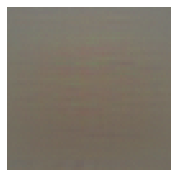

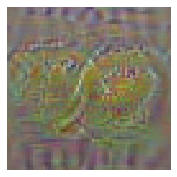

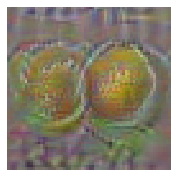

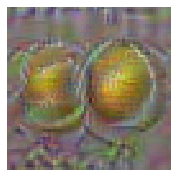

In [4]:
target_y = 4 
print(data['class_names'][target_y])
X = create_class_visualization(target_y, model, show_every=25)

## Feature Inversion

为了理解卷积网络学习识别特征的类型，论文 Understanding Deep Image Representations by Inverting them 尝试从特征表示中重建图像。我们可以使用预训练好的网络的图像梯度来实现这个想法

具体来说，给定一张图片 $I$，$\phi_\ell(I)$ 表示卷积神经网络 $\phi$ 的第 $\ell$ 层的激活函数。我们希望找到一张图片 $I^*$ 在网络 $\phi$ 的第 $\ell$ 层有着和 $I$ 一样特征表示，这个问题可以描述为如下的数学公式 

$$I^*=argmin_{I'}||\phi_\ell(I)-\phi_\ell(I')||+R(I')$$

其中，$||\cdot||_2^2$ 表示几何距离。上面的 $R$ 表示一个正则项。我们可以通过梯度下降解决这个问题的最优化——计算生成图片的梯度。我们使用显式的 L2 正则化以及定期模糊图片的隐式的正则化组成我们的正则项

$$R(I')+\lambda||I'||_2^2$$

In [5]:
def invert_features(target_feats, layer, model, **kwargs):
    """
    按照 Mahendran 和 Vedaldi 2015 使用 L2 正则化和周期性模糊进行特征反演

    输入：
    - target_feats：目标图片的图像特征，大小为 (1, C, H, W)
    - layer：在第几层提取特征
    - model：PretrainedCNN
    
    关键字参数：
    - learning_rate
    - num_iterations
    - 12_reg
    - blur_every
    - show_every

    返回：
    - X：生成的大小为 (1, 3, 64, 64) 匹配目标特征的图片
    """
    learning_rate = kwargs.pop('learning_rate', 10000)
    num_iterations = kwargs.pop('num_iterations', 500)
    l2_reg = kwargs.pop('l2_reg', 1e-7)
    blur_every = kwargs.pop('blur_every', 1)
    show_every = kwargs.pop('show_every', 50)

    X = np.random.randn(1, 3, 64, 64)
    for t in range(num_iterations):
        # 计算重建损失相对于图像的梯度
        # 应该使用 L2 正则化惩罚生成图片中较大的像素值
        # 然后使用学习率更新生成的图片
      current_feats, cache = model.forward(X, start=None, end=layer, mode ='test')
      diff = current_feats - target_feats
      loss = np.sum(diff * diff) #+ np.sum(X * X)
      if (show_every > 0) and (t % show_every == 0 or t + 1 == num_iterations):
        print('diff loss is:', loss)
      dout = 2 * diff
      dX, _ = model.backward(dout, cache)
      dX += 2 * l2_reg * X
      X -= learning_rate * dX

      X = np.clip(X, -data['mean_image'], 255.0 - data['mean_image'])
      
      if (blur_every > 0) and t % blur_every == 0:
        X = blur_image(X)

      if (show_every > 0) and (t % show_every == 0 or t + 1 == num_iterations):
        plt.imshow(deprocess_image(X, data['mean_image']))
        plt.gcf().set_size_inches(3, 3)
        plt.axis('off')
        plt.title('t = %d' % t)
        plt.show()
    return X

## Shallow feature reconstruction

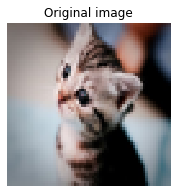

diff loss is: 256.8479


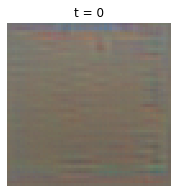

diff loss is: 40.083607


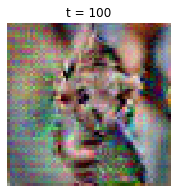

diff loss is: 22.381233


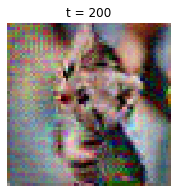

diff loss is: 11.435657


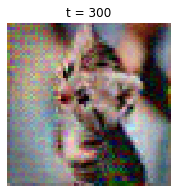

diff loss is: 6.0978737


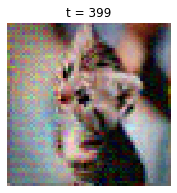

In [6]:
# 尝试从第四个卷积层重建特征
filename = 'kitten.jpg'
layer = 3 # 层序号从 0 开始计数
img = Image.open(filename)
img_arr = np.asarray(img)
img = np.array(Image.fromarray(img_arr).resize((64, 64)))

plt.imshow(img)
plt.gcf().set_size_inches(3, 3)
plt.title('Original image')
plt.axis('off')
plt.show()

# 在将图片喂入网络前需要一点预处理工作：减去均值，增加一个维度等
img_pre = preprocess_image(img, data['mean_image'])

# 从图片提取特征
feats, _ = model.forward(img_pre, end=layer)

# 反演特征
kwargs = {'num_iterations': 400,
          'learning_rate': 5000,
          'l2_reg': 1e-8,
          'show_every': 100,
          'blur_every': 10,}
X = invert_features(feats, layer, model, **kwargs)

## Deep feature reconstruction

接下来，我们尝试使用更深一些的层的特征来重建图片产生更有意义的结果。我们尝试使用第七个卷积层的特征来重建图片

提示：如果读过 Mahendran 和 Vedaldi 的论文应该知道，从深度特征重建出来的图片和原始图像不太相似。但是在 1000 次迭代后的结果中会看到一些可识别的结果

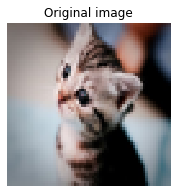

diff loss is: 12.237831


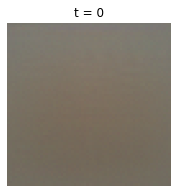

diff loss is: 0.9378669


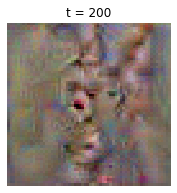

diff loss is: 0.5821189


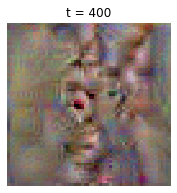

diff loss is: 0.4335124


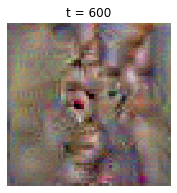

diff loss is: 0.34681433


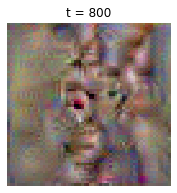

diff loss is: 0.29229409


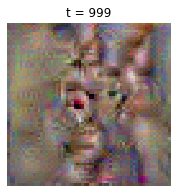

In [7]:
filename = 'kitten.jpg'
layer = 6
img = Image.open(filename)
img_arr = np.asarray(img)
img = np.array(Image.fromarray(img_arr).resize((64, 64)))

plt.imshow(img)
plt.gcf().set_size_inches(3, 3)
plt.title('Original image')
plt.axis('off')
plt.show()

img_pre = preprocess_image(img, data['mean_image'])

feats, _ = model.forward(img_pre, end=layer)

kwargs = {'num_iterations': 1000,
          'learning_rate': 15000,
          'l2_reg': 1e-8,
          'show_every': 200,
          'blur_every': 200,}
X = invert_features(feats, layer, model, **kwargs)

## DeepDream

DeepDream 的想法很简单：从网络中选取某一层，将起始图片喂入网络中，然后在所选层提取特征，将该层的梯度设置为激活，然后进行反向传播。这样做可以调整图片以放大所选层的激活

在 DeepDream 中，通常从其中某一卷积层提取特征，可以使得我们生成不同分辨率的图片

我们可以使用预先训练好的网络来实现 DeepDream，结果可能不像 google 那样，他们使用的网络更深一些，但是我们仍能够生成一席有趣的图像

In [8]:
def deepdream(X, layer, model, **kwargs):
    """
    生成 DeepDream 图像

    输入：
    - X：起始图片，大小为 (1, 3, H, W)
    - layer：Index of layer at which to dream
    - model：PretrainedCNN

    关键字参数：
    - learning_rate
    - max_jitter
    - num_iterations
    - show_every
    """
    
    X = X.copy()
    
    learning_rate = kwargs.pop('learning_rate', 5.0)
    max_jitter = kwargs.pop('max_jitter', 16)
    num_iterations = kwargs.pop('num_iterations', 100)
    show_every = kwargs.pop('show_every', 25)
    
    for t in range(num_iterations):
        ox, oy = np.random.randint(-max_jitter, max_jitter+1, 2)
        X = np.roll(np.roll(X, ox, -1), oy, -2)

        dX = None
        
        # 通过 DeepDream 方法计算图片梯度 dX
        # 然后通过 forward 和 backward 方法提取激活，同时为选中层设置梯度
        # 计算完图片梯度 dX 之后根据学习率更新图片 X

        act , cache = model.forward(X, start=None, end=layer, mode='test')
        dX, _ = model.backward(act, cache)
        X += learning_rate * dX

        X = np.roll(np.roll(X, -ox, -1), -oy, -2)

        mean_pixel = data['mean_image'].mean(axis=(1, 2), keepdims=True)
        X = np.clip(X, -mean_pixel, 255.0 - mean_pixel)

        if t == 0 or (t + 1) % show_every == 0:
            img = deprocess_image(X, data['mean_image'], mean='pixel')
            plt.imshow(img)
            plt.title('t = %d' % (t + 1))
            plt.gcf().set_size_inches(8, 8)
            plt.axis('off')
            plt.show()
    return X

1059 1887
287 512
(287, 512, 3)


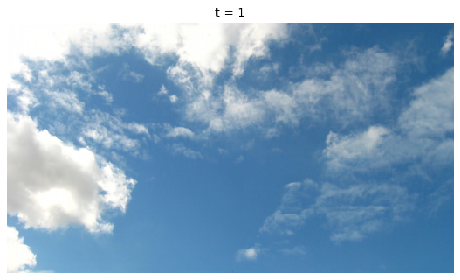

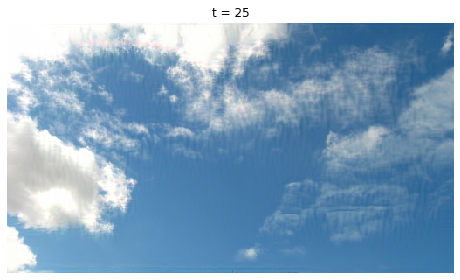

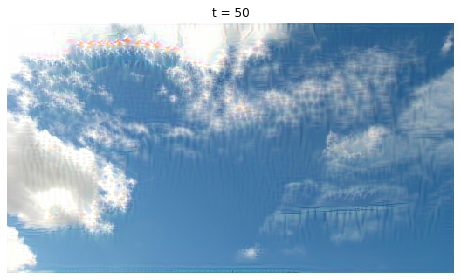

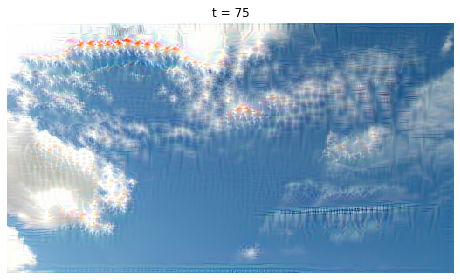

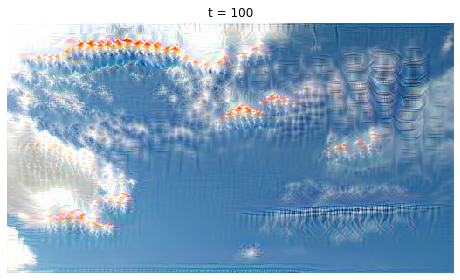

...

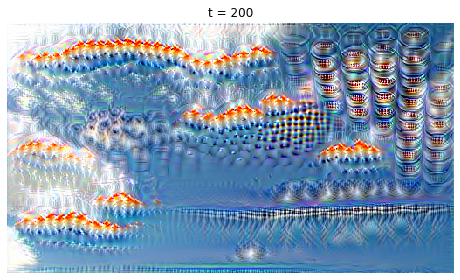

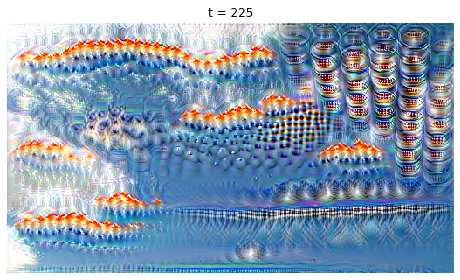

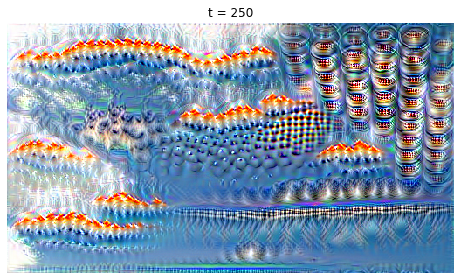

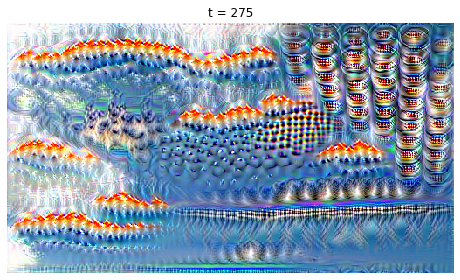

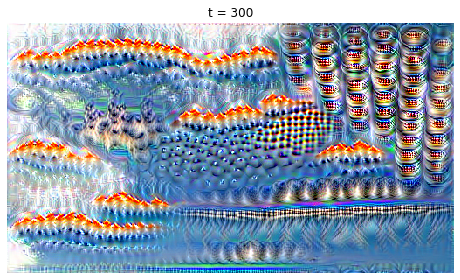

In [9]:
def read_image(filename, max_size):
    """
    读入图片，重新调整图片大小使其最大边为 max_size
    """
    img = Image.open(filename)
    img_arr = np.asarray(img)
    H, W, _ = img_arr.shape
    print(H, W)
    if H >= W:
        tmp = int(W * float(max_size) / H)
        img = np.array(Image.fromarray(img_arr).resize((max_size, tmp)))
    elif H < W:
        tmp = int(H * float(max_size) / W)
        img = np.array(Image.fromarray(img_arr).resize((max_size, tmp)))
        print(tmp, max_size)

    return img

filename = 'sky.jpg'
max_size = 512
img = read_image(filename, max_size)
print(img.shape)
plt.imshow(img)
plt.axis('off')

img_pre = preprocess_image(img, data['mean_image'], mean='pixel')

out = deepdream(img_pre, 7, model, learning_rate=2000, num_iterations=300)

266 400
340 512


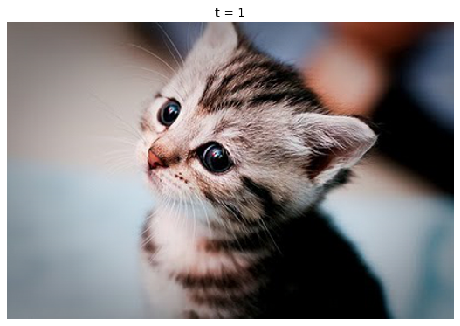

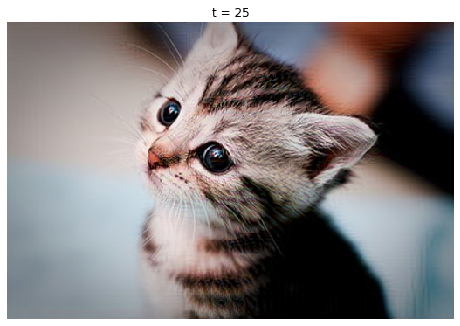

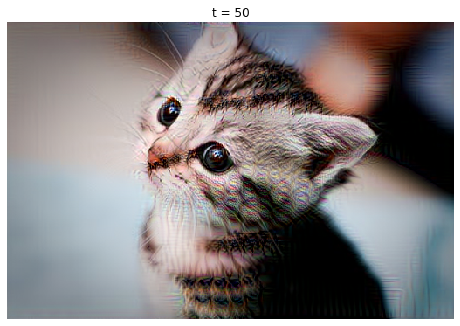

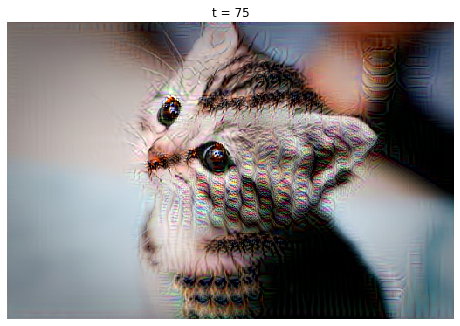

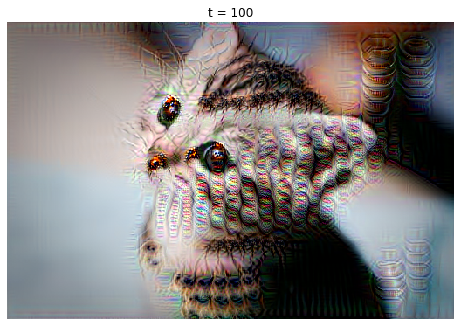

...

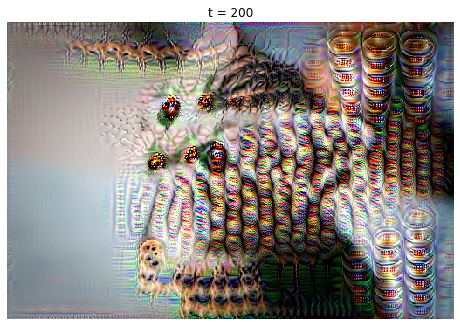

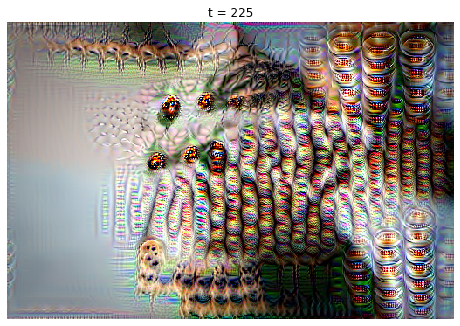

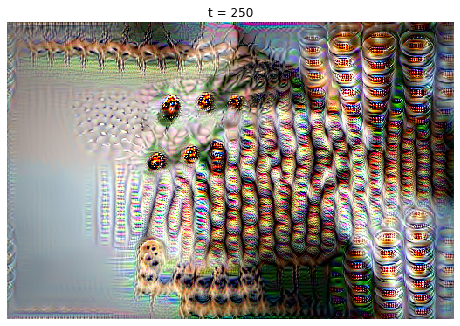

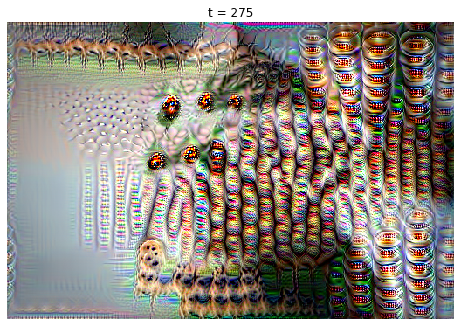

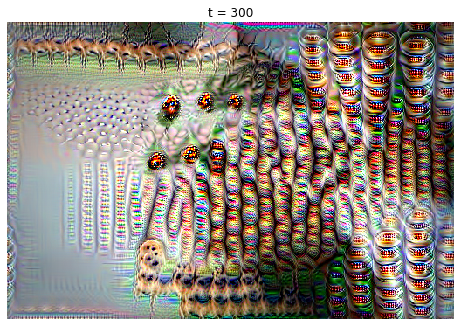

In [10]:
filename = 'kitten.jpg'
max_size = 512
img = read_image(filename, max_size)
plt.imshow(img)
plt.axis('off')

# Preprocess the image by converting to float, transposing,
# and performing mean subtraction.
img_pre = preprocess_image(img, data['mean_image'], mean='pixel')

out = deepdream(img_pre, 7, model, learning_rate=2000, num_iterations=300)